In [87]:
from dask.distributed import Client, LocalCluster
import pystac_client
import stackstac
import dask.array as da
from geogif import gif, dgif
import numpy as np
import xarray as xr

In [116]:
import dask.array as da
import pandas as pd

In [28]:
bbox = (-64.038438,-8.837991,-63.792619,-8.660862)

In [132]:
# Function to get items for a specific quarter of a year
def get_sentinel_items_for_quarter(year, start_month, end_month):
    start_date = f"{year}-{start_month:02d}-01"
    if end_month == 12:
        end_date = f"{year + 1}-01-01"  # Handle December properly
    else:
        end_date = f"{year}-{end_month:02d}-01"
    items = (
        pystac_client.Client.open("https://earth-search.aws.element84.com/v1")
        .search(
            bbox=bbox,
            collections=["sentinel-2-l2a"],
            datetime=f"{start_date}/{end_date}",
            query={"eo:cloud_cover": {"lt": 2}},
        )
    ).item_collection()
    print(year, start_month, end_month, len(items))
    return items

In [ ]:
# Function to get items for a specific quarter of a year
def get_landsat_items_for_quarter(year, start_month, end_month):
    start_date = f"{year}-{start_month:02d}-01"
    if end_month == 12:
        end_date = f"{year + 1}-01-01"  # Handle December properly
    else:
        end_date = f"{year}-{end_month:02d}-01"
    items = (
        pystac_client.Client.open("https://earth-search.aws.element84.com/v1")
        .search(
            bbox=bbox,
            collections=["landsat-c2-l2"],
            datetime=f"{start_date}/{end_date}",
            query={"eo:cloud_cover": {"lt": 2}},
        )
    ).item_collection()
    print(year, start_month, end_month, len(items))
    return items

In [133]:
%%time
# Initialize an empty list to hold quarterly composites
quarterly_composites = []

# Loop through each year and quarter
for year in range(2016, 2024):
    for start_month, end_month in [(1, 4), (4, 7), (7, 10), (10, 12)]:
#         print(year, start_month, end_month)
        items = get_items_for_quarter(year, start_month, end_month)
        if len(items) > 0:
            # Stack the items
            stack = stackstac.stack(
                items,
                epsg=32619,
                chunksize=100000000,
                bounds_latlon=bbox,
                resolution=30
            )

            # Compute the median composite for the quarter
            scl = stack.sel(band=["scl"])
            # Sentinel-2 Scene Classification Map: nodata, saturated/defective, dark, cloud shadow, cloud med. prob., cloud high prob., cirrus
            invalid = da.isin(scl, [0, 1, 2, 3, 8, 9, 10])
            valid = stack.where(~invalid)

            rgb = valid.sel(band=["red", "green", "blue"])

#             print(year, start_month, end_month)
            quarterly_composites.append(composite)

2016 1 4 0
2016 4 7 0
2016 7 10 0
2016 10 12 0
2017 1 4 0
2017 4 7 6


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2017 7 10 16


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2017 10 12 0
2018 1 4 0
2018 4 7 17


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2018 7 10 78


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2018 10 12 1


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2019 1 4 0
2019 4 7 12


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2019 7 10 38


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2019 10 12 0
2020 1 4 0
2020 4 7 16


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2020 7 10 49


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2020 10 12 0
2021 1 4 0
2021 4 7 7


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2021 7 10 55


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2021 10 12 0
2022 1 4 0
2022 4 7 9


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2022 7 10 31


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2022 10 12 4


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2023 1 4 0
2023 4 7 3


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2023 7 10 28


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


2023 10 12 1
CPU times: user 2.91 s, sys: 378 ms, total: 3.29 s
Wall time: 30.1 s


/Users/danielschneider/miniconda3/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


In [126]:
len(quarterly_composites)

17

In [90]:
# Concatenate all quarterly composites into a single xarray DataArray
final_composite = xr.concat(quarterly_composites, dim="time", coords='minimal', compat='override')

In [91]:
 with LocalCluster(n_workers=24,
    threads_per_worker=4,
    memory_limit='10GB'
) as cluster, Client(cluster) as client:
    # Do something using 'client'
    final_result = final_composite.compute()

/Users/danielschneider/miniconda3/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/Users/danielschneider/miniconda3/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/Users/danielschneider/miniconda3/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/Users/danielschneider/miniconda3/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/Users/danielschneider/miniconda3/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/Users/danielschneider/miniconda3/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/Users/danielschneider/miniconda3/lib/python3.12/site-packages/dask/utils.py

2024-06-04 09:29:57,057 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:58606
Traceback (most recent call last):
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/comm/tcp.py", line 230, in read
    buffer = await read_bytes_rw(stream, buffer_nbytes)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/comm/tcp.py", line 366, in read_bytes_rw
    actual = await stream.read_into(chunk)  # type: ignore[arg-type]
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/worker.py", line 2059, in gather_dep
    response = await get_data_from_worker(
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/dani

2024-06-04 09:29:57,386 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:58613
Traceback (most recent call last):
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/comm/tcp.py", line 227, in read
    frames_nosplit = await read_bytes_rw(stream, frames_nosplit_nbytes)
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/comm/tcp.py", line 366, in read_bytes_rw
    actual = await stream.read_into(chunk)  # type: ignore[arg-type]
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/worker.py", line 2059, in gather_dep
    response = await get_data_from_worker(
               ^^^^^^^^^^^^^^^

2024-06-04 09:30:10,183 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:58616
Traceback (most recent call last):
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/comm/tcp.py", line 227, in read
    frames_nosplit = await read_bytes_rw(stream, frames_nosplit_nbytes)
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/comm/tcp.py", line 366, in read_bytes_rw
    actual = await stream.read_into(chunk)  # type: ignore[arg-type]
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/Users/danielschneider/miniconda3/lib/python3.12/site-packages/distributed/worker.py", line 2059, in gather_dep
    response = await get_data_from_worker(
               ^^^^^^^^^^^^^^^

In [97]:
cleaned = final_result.ffill("time").bfill("time")

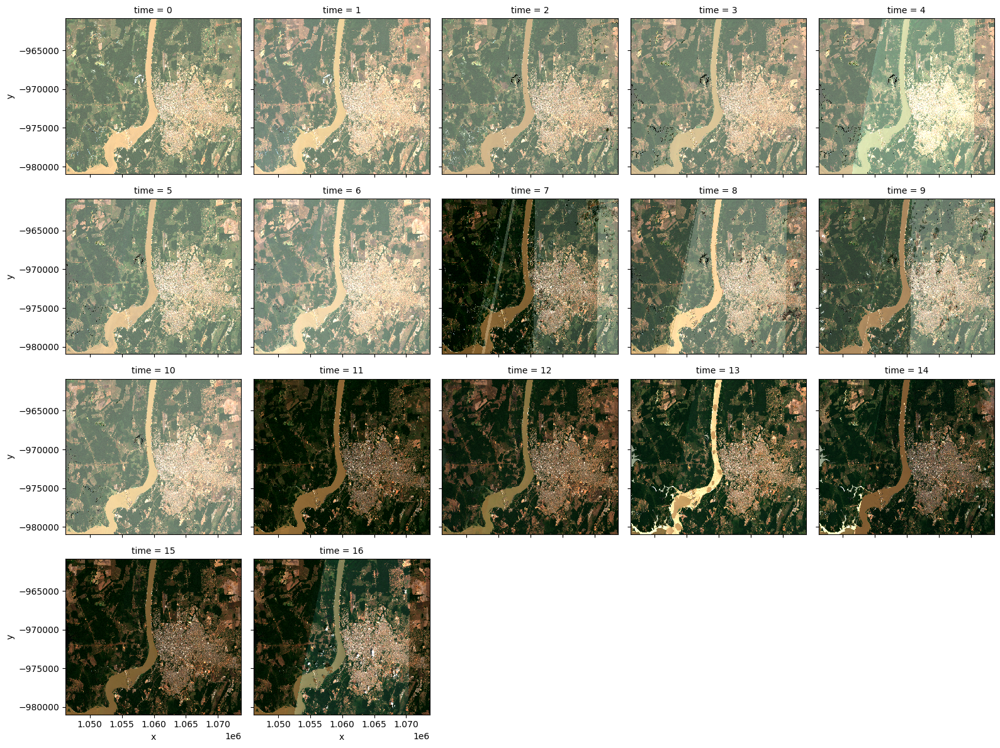

In [111]:
cleaned.plot.imshow(col="time", rgb="band", col_wrap=5, robust=True)

In [113]:
cleaned.time

<xarray.DataArray 'time' (time: 17)> Size: 136B
array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])
Coordinates: (12/41)
    s2:datatake_type                         <U8 32B 'INS-NOBS'
    constellation                            <U10 40B 'sentinel-2'
    s2:saturated_defective_pixel_percentage  int64 8B 0
    s2:product_type                          <U7 28B 'S2MSI2A'
    mgrs:latitude_band                       <U1 4B 'L'
    instruments                              <U3 12B 'msi'
    ...                                       ...
    eo:cloud_cover                           float64 8B 0.3722
    s2:high_proba_clouds_percentage          float64 8B 0.007946
    mgrs:grid_square                         <U2 8B 'LR'
    s2:unclassified_percentage               float64 8B 0.2124
    earthsearch:s3_path                      <U80 320B 's3://sentinel-cogs/se...
    s2:not_vegetated_percentage              float64 8B 11.19
Dimensions without coordinates: time

In [122]:
start_date = pd.Timestamp('2016-01-01')
timestamps = pd.date_range(start=start_date, periods=len(quarterly_composites), freq='QS')
# Assign these timestamps to the time dimension of final_composite
cleaned = cleaned.assign_coords(time=("time", timestamps))

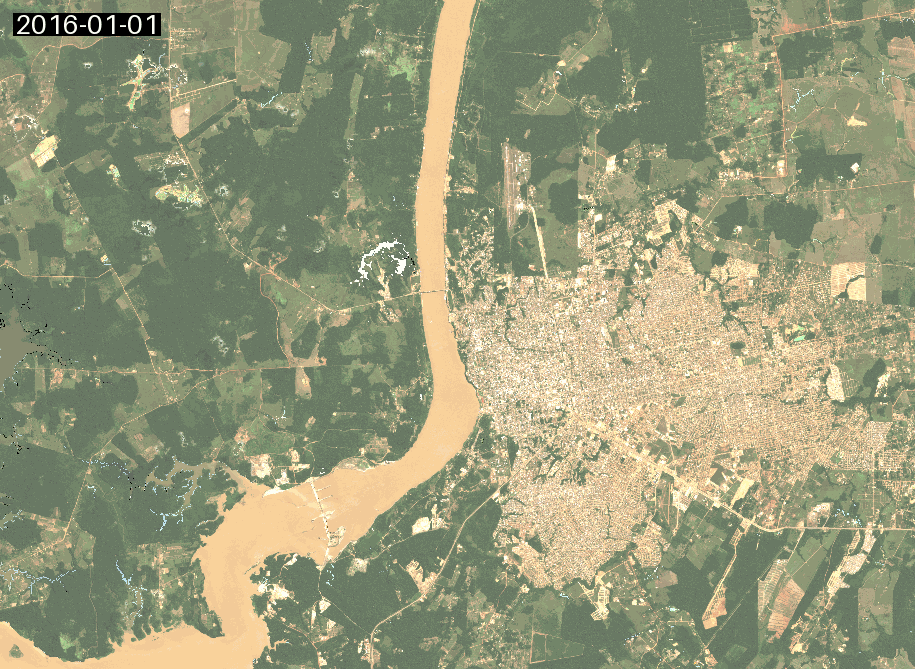

In [124]:
gif(cleaned, fps=8)

In [118]:
start_date = pd.Timestamp('2016-01-01')
timestamps = pd.date_range(start=start_date, periods=len(quarterly_composites), freq='QS')
# Assign these timestamps to the time dimension of final_composite
cleaned = cleaned.assign_coords(time=("time", timestamps))

DatetimeIndex(['2016-01-01', '2016-04-01', '2016-07-01', '2016-10-01',
               '2017-01-01', '2017-04-01', '2017-07-01', '2017-10-01',
               '2018-01-01', '2018-04-01', '2018-07-01', '2018-10-01',
               '2019-01-01', '2019-04-01', '2019-07-01', '2019-10-01',
               '2020-01-01'],
              dtype='datetime64[ns]', freq='QS-JAN')